# DATA LOAD

In [97]:
# Optional for clear plotting on Macs
# %config InlineBackend.figure_format='retina'

# Some of the network training leads to warnings. When we know and are OK with
#  what's causing the warning and simply don't want to see it, we can use the
#  following code. Run this block
#  to disable warnings
import sys
import os
import warnings

warnings.filterwarnings("ignore")

if not sys.warnoptions:

    warnings.simplefilter("ignore")
    os.environ["PYTHONWARNINGS"] = "ignore"



In [98]:
# Install libraries
!pip install dame_flame
!pip install stargazer

You should consider upgrading via the '/Users/tegochang/opt/miniconda3/bin/python3.9 -m pip install --upgrade pip' command.
You should consider upgrading via the '/Users/tegochang/opt/miniconda3/bin/python3.9 -m pip install --upgrade pip' command.


In [99]:
# Load libraries
import pandas as pd
import numpy as np
from scipy import stats
from plotnine import *
import dame_flame
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from pathlib import Path
import altair as alt
alt.data_transformers.disable_max_rows()
from statsmodels.graphics.gofplots import ProbPlot


In [100]:
# Load datasets
fl = pd.read_csv('../00_source_data/listings_florida.csv.gz')
ca = pd.read_csv('../00_source_data/listings_california.csv.gz')

In [101]:
# Add county column to datasets
fl['county'] = 'FL'
ca['county'] = 'CA'

In [102]:
# Merge datasets into one
frames = [fl, ca]
listings = pd.concat(frames)

# DATA CLEANING

In [103]:
# List unecessary columns
columns_to_be_dropped = [
    "scrape_id",
    "listing_url",
    "name",
    "host_id",
    "description",
    "neighborhood_overview",
    "picture_url",
    "host_url",
    "host_name",
    "host_location",
    "host_about",
    "host_thumbnail_url",
    "host_picture_url",
    "host_neighbourhood",
    "host_listings_count",
    "host_verifications",
    "neighbourhood",
    "neighbourhood_cleansed",
    "neighbourhood_group_cleansed",
    "property_type",
    "bathrooms",
    "minimum_minimum_nights",
    "maximum_minimum_nights",
    "minimum_maximum_nights",
    "maximum_maximum_nights",
    "maximum_nights_avg_ntm",
    "calendar_updated",
    "availability_30",
    "availability_60",
    "availability_90",
    "calendar_last_scraped",
    "number_of_reviews",
    "reviews_per_month",
    "number_of_reviews_l30d",
    "first_review",
    "last_review",
    "license",
    "calculated_host_listings_count_entire_homes",
    "calculated_host_listings_count_private_rooms",
    "calculated_host_listings_count_shared_rooms",
    "host_total_listings_count",
    "last_scraped",
    "host_since",
    "host_response_rate",
    "availability_365",
    "minimum_nights_avg_ntm",
    "has_availability"
]


In [104]:
# Drop unecessary columns
listings = listings.drop(columns_to_be_dropped, axis = 1)


In [105]:
listings

,id,host_response_time,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,latitude,longitude,room_type,accommodates,...,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,county
0,57818,within an hour,85%,f,t,t,26.016700,-80.124370,Entire home/apt,6,...,4.61,4.70,4.60,5.00,4.96,4.88,4.70,f,1,FL
1,69824,within an hour,60%,f,t,t,25.976410,-80.120520,Entire home/apt,6,...,4.00,5.00,5.00,5.00,4.00,5.00,4.00,f,2,FL
2,83449,within a few hours,92%,f,t,t,26.033920,-80.142010,Entire home/apt,5,...,4.74,4.84,4.84,4.89,4.89,4.79,4.89,f,8,FL
3,105411,within a day,0%,f,t,t,26.046780,-80.368090,Entire home/apt,5,...,5.00,5.00,5.00,5.00,5.00,4.25,5.00,f,1,FL
4,129061,within a few hours,26%,f,t,t,25.993320,-80.118870,Entire home/apt,7,...,4.65,4.78,4.56,4.61,5.00,4.61,4.50,f,6,FL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33324,53683908,within an hour,97%,f,t,t,34.105036,-118.341116,Entire home/apt,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,5,CA
33325,53684062,within an hour,97%,f,t,t,34.062093,-118.245931,Entire home/apt,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,5,CA
33326,53684370,within an hour,97%,f,t,t,34.060570,-118.248007,Entire home/apt,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,5,CA
33327,53684541,within an hour,92%,f,t,t,34.101427,-118.348458,Entire home/apt,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,11,CA


In [110]:
listings.columns
listings['amenities']
listings["bathrooms_text"].unique()

array(['1 bath', '2 baths', '1.5 baths', '1.5 shared baths', '3 baths',
       '1 shared bath', '1 private bath', nan, '5 baths', '4 baths',
       '2.5 baths', '3.5 baths', '2 shared baths', '4.5 baths',
       '0 shared baths', '3 shared baths', '0 baths', '8 baths',
       '5.5 baths', '20 baths', '6.5 baths', '7.5 baths', '6 baths',
       '5 shared baths', '7 baths', '10 baths', 'Shared half-bath',
       '2.5 shared baths', '3.5 shared baths', 'Half-bath', '8.5 baths',
       '17 baths', '11 shared baths', '8 shared baths',
       '8.5 shared baths', '11.5 shared baths', '4.5 shared baths',
       '11 baths', 'Private half-bath', '4 shared baths', '9 baths',
       '12.5 baths', '9.5 baths', '11.5 baths', '10.5 baths', '13 baths',
       '5.5 shared baths', '25 baths', '6 shared baths', '12 baths',
       '15.5 baths'], dtype=object)

In [95]:
# Clean categorical variables
listings['host_response_time'] = np.where(listings['host_response_time'] == 'within an hour', 0, listings['host_response_time'])
listings['host_response_time'] = np.where(listings['host_response_time'] == 'within a few hours', 1, listings['host_response_time'])
listings['host_response_time'] = np.where(listings['host_response_time'] == 'within a day', 2, listings['host_response_time'])
listings['host_response_time'] = np.where(listings['host_response_time'] == 'a few days or more', 3, listings['host_response_time'])

listings['host_acceptance_rate'] = listings['host_acceptance_rate'].str.strip('%')

listings['host_is_superhost'] = np.where(listings['host_is_superhost'] == 't', 1, listings['host_is_superhost'])
listings['host_is_superhost'] = np.where(listings['host_is_superhost'] == 'f', 0, listings['host_is_superhost'])

listings['host_has_profile_pic'] = np.where(listings['host_has_profile_pic'] == 't', 1, listings['host_has_profile_pic'])
listings['host_has_profile_pic'] = np.where(listings['host_has_profile_pic'] == 'f', 0, listings['host_has_profile_pic'])

listings['host_identity_verified'] = np.where(listings['host_identity_verified'] == 't', 1, listings['host_identity_verified'])
listings['host_identity_verified'] = np.where(listings['host_identity_verified'] == 'f', 0, listings['host_identity_verified'])

listings['room_type'] = np.where(listings['room_type'] == 'Entire home/apt', 0, listings['room_type'])
listings['room_type'] = np.where(listings['room_type'] == 'Hotel room', 1, listings['room_type'])
listings['room_type'] = np.where(listings['room_type'] == 'Private room', 2, listings['room_type'])
listings['room_type'] = np.where(listings['room_type'] == 'Shared room', 3, listings['room_type'])

listings['essentials'] = listings['amenities']
listings['essentials'] = np.where(listings['essentials'].str.contains('Essential'), 1, listings['essentials'])
listings['essentials'] = np.where(listings['essentials'].str.contains('Essential') == False, 0, listings['essentials'])

listings['other_amenities'] = listings['amenities']
listings["other_amenities"] = np.where(
    listings["other_amenities"].str.contains("Essential") == False,
    listings["other_amenities"].apply(lambda x: len(x.split(","))),
    (
        np.where(
            listings["other_amenities"].str.contains("Essential") == True,
            listings["other_amenities"].apply(lambda x: len(x.split(",")) - 1),
            listings["other_amenities"],
        )
    ),
)

listings['instant_bookable'] = np.where(listings['instant_bookable'] == 't', 1, listings['instant_bookable'])
listings['instant_bookable'] = np.where(listings['instant_bookable'] == 'f', 0, listings['instant_bookable'])

listings['bathrooms_text'] = listings['bathrooms_text'].str.split(" ").str[0]
listings["bathrooms_text"] = np.where(
    listings["bathrooms_text"] == "Private",
    1,
    (
        np.where(
            listings["bathrooms_text"] == "Shared",
            1,
            np.where(
                listings["bathrooms_text"] == "Half-bath",
                1,
                listings["bathrooms_text"],
            ),
        )
    ),
)

listings['price'] = listings['price'].str.strip('$')
listings['number_of_reviews_ltm'] = np.where(listings['number_of_reviews_ltm'] <= 0, 1, listings['number_of_reviews_ltm'])
listings['total_bookings'] = listings['number_of_reviews_ltm'] * 100/67


In [16]:
# Add decisions to be taken across NA columns
na_treatments = {
    'host_since': "drop rows", #only 4 unique hosts, with a lot of ther nas in other columns as well
    'host_response_time': "drop rows", #No relationship with other variables found yet. Very important variable, do not want to impute.
    'host_response_rate': "drop rows", #No relationship with other variables found yet. Very important variable, do not want to impute.
    'host_acceptance_rate': "drop rows", #only 79 different after dropping above 2, impute if possible
    'host_is_superhost': "drop rows", #Very important variable, do not want to impute. 
    'bathrooms_text': "drop rows",
    "beds": "imput_beds",
    'host_has_profile_pic': "nothing", 
    'host_identity_verified': "nothing", #Gets auto dropped with superhost
    "review_scores_rating": "drop rows",
    "bedrooms": "impute_bedrooms",
    "review_scores_accuracy": "drop rows",
    "review_scores_value": "drop rows"
}

In [17]:
listings2 = listings.copy()

In [18]:
# Apply decisions on NA columns
for i in listings2.columns:
    if i in na_treatments.keys():
        if na_treatments[i] == "drop rows":
            listings2 = listings2[listings2[i].notna()]
        if na_treatments[i] == "impute_bedrooms":
            listings2["bedrooms"] = np.where(
                listings2["bedrooms"].isna() == True, 0, listings2["bedrooms"],
            )
        if na_treatments[i] == "impute_beds":
            listings2["beds"] = np.where(
                (listings2["beds"].isna() == True)
                & (listings2["bedrooms"].isna() == False),
                1,
                listings2["beds"],
            )


listings2 = listings2[listings2["beds"].notna()]
listings2 = listings2.drop(columns=['amenities'])



In [19]:
# Check NA
listings2.isna().sum()

id                                0
host_response_time                0
host_acceptance_rate              0
host_is_superhost                 0
host_has_profile_pic              0
host_identity_verified            0
latitude                          0
longitude                         0
room_type                         0
accommodates                      0
bathrooms_text                    0
bedrooms                          0
beds                              0
price                             0
minimum_nights                    0
maximum_nights                    0
number_of_reviews_ltm             0
review_scores_rating              0
review_scores_accuracy            0
review_scores_cleanliness         0
review_scores_checkin             0
review_scores_communication       0
review_scores_location            0
review_scores_value               0
instant_bookable                  0
calculated_host_listings_count    0
county                            0
essentials                  

# CALCULATE ANNUAL LISTING REVENUE

In [20]:
# Calculate Annual Revenue
listings2['price'] = listings2['price'].apply(lambda x: float(x.split()[0].replace(',', '')))
listings2['annual_listing_revenue'] = listings2.price * listings2['total_bookings']
listings2 = listings2.drop(columns=['price'])


In [21]:
#Check for zero annual revenue 
listings2[listings2['annual_listing_revenue'] <= 0]

,id,host_response_time,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,latitude,longitude,room_type,accommodates,...,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,county,essentials,other_amenities,total_bookings,annual_listing_revenue


In [22]:
listings3 = listings2.copy()

In [23]:
# Change datatypes
listings3['bathrooms_text'] = listings3['bathrooms_text'].astype('float')
listings3['host_acceptance_rate'] = listings3['host_acceptance_rate'].astype('int')
listings3['bedrooms'] = listings3['bedrooms'].astype('int')
listings3['beds'] = listings3['beds'].astype('int')
listings3["county"] = listings3["county"].astype("category")
listings3["county"] = listings3["county"].cat.codes
listings3['host_response_time'] = listings3['host_response_time'].astype('category')
listings3['host_is_superhost'] = listings3['host_is_superhost'].astype('category')
listings3['host_has_profile_pic'] = listings3['host_has_profile_pic'].astype('category')
listings3['host_identity_verified'] = listings3['host_identity_verified'].astype('category')
listings3['room_type'] = listings3['room_type'].astype('category')
listings3['essentials'] = listings3['essentials'].astype('category')
listings3['other_amenities'] = listings3['other_amenities'].astype('int')
# listings3['has_availability'] = listings3['has_availability'].astype('category')
listings3['instant_bookable'] = listings3['instant_bookable'].astype('category')
listings3['annual_listing_revenue'] = listings3['annual_listing_revenue'].astype('float')


In [24]:
# Check code for counties 
c = listings.county.astype('category')

d = dict(enumerate(c.cat.categories))
print (d)

{0: 'CA', 1: 'FL'}


In [25]:
listings3.isna().sum()

id                                0
host_response_time                0
host_acceptance_rate              0
host_is_superhost                 0
host_has_profile_pic              0
host_identity_verified            0
latitude                          0
longitude                         0
room_type                         0
accommodates                      0
bathrooms_text                    0
bedrooms                          0
beds                              0
minimum_nights                    0
maximum_nights                    0
number_of_reviews_ltm             0
review_scores_rating              0
review_scores_accuracy            0
review_scores_cleanliness         0
review_scores_checkin             0
review_scores_communication       0
review_scores_location            0
review_scores_value               0
instant_bookable                  0
calculated_host_listings_count    0
county                            0
essentials                        0
other_amenities             

# MAP

In [26]:
# Map
# import altair as alt
# from vega_datasets import data
# alt.data_transformers.disable_max_rows()

# counties = alt.topo_feature(data.us_10m.url, "counties")
# points = alt.Chart(listings3).mark_circle().encode(
#     longitude='longitude:Q',
#     latitude='latitude:Q',
#     size=alt.value(10),
#     color=alt.Color('host_is_superhost', scale=alt.
#                       Scale(scheme = 'dark2'))
# )
# map_florida = (
#     alt.Chart(data=counties)
#     .mark_geoshape(stroke="white", strokeWidth=1, fill="lightgray",)
#     .transform_calculate(state_id="(datum.id / 1000)|0")
#     .transform_filter((alt.datum.state_id) == [6, 13])
#     .project(type='albersUsa')
# )

# full = map_florida + points
# full.properties(width=1000, height=500)
# # full.properties(width=2800, height=2800)


In [27]:
# Writing Final Data frame to CSV
listings3.to_csv('fl_ca_listings.csv')


In [30]:
# Load dataset
fl_cali = pd.read_csv("./fl_ca_listings.csv")
fl_cali = fl_cali.drop(columns=["Unnamed: 0"])
fl_cali

,id,host_response_time,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,latitude,longitude,room_type,accommodates,...,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,county,essentials,other_amenities,total_bookings,annual_listing_revenue
0,57818,0,85,0,1,1,26.016700,-80.124370,0,6,...,4.96,4.88,4.70,0,1,1,1,57,22.388060,5261.194030
1,69824,0,60,0,1,1,25.976410,-80.120520,0,6,...,4.00,5.00,4.00,0,2,1,0,19,1.492537,208.955224
2,83449,1,92,0,1,1,26.033920,-80.142010,0,5,...,4.89,4.79,4.89,0,8,1,1,19,1.492537,147.761194
3,105411,2,0,0,1,1,26.046780,-80.368090,0,5,...,5.00,4.25,5.00,0,1,1,0,13,1.492537,350.746269
4,129061,1,26,0,1,1,25.993320,-80.118870,0,7,...,5.00,4.61,4.50,0,6,1,1,38,4.477612,1410.447761
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25765,53607721,0,100,0,1,1,34.097434,-118.306310,2,1,...,5.00,5.00,5.00,1,29,0,0,2,1.492537,29.850746
25766,53632780,0,61,1,1,1,33.873560,-118.333000,2,2,...,5.00,5.00,5.00,0,1,0,1,31,1.492537,97.014925
25767,53646927,0,91,0,1,1,34.100317,-118.083333,2,2,...,5.00,5.00,5.00,1,4,0,1,30,1.492537,74.626866
25768,53664855,0,100,0,1,1,34.046048,-118.090732,2,2,...,5.00,5.00,5.00,0,7,0,1,24,1.492537,55.223881


# EDA IN CLEANED DATA

In [31]:
superhosts = fl_cali[fl_cali["host_is_superhost"] == 1]
regularhosts = fl_cali[fl_cali["host_is_superhost"] == 0]

In [32]:
# Check distribution
print(superhosts.shape)
print(regularhosts.shape)


(10179, 30)
(15591, 30)


In [33]:
listings = fl_cali.copy()

# DATA PREPARATION FOR DAME

In [34]:
# Discretize continous variables for DAME
listings["bedrooms"] = pd.qcut(listings.bedrooms.rank(method="first"), 2, labels=False)

listings["host_acceptance_rate"] = pd.qcut(
    listings.host_acceptance_rate.rank(method="first"), 2, labels=False
)

listings["accommodates"] = listings["accommodates"].astype(int)
listings["accommodates"] = pd.qcut(
    listings.accommodates.rank(method="first"), 2, labels=False
)

listings["bathrooms_text"] = round(listings["bathrooms_text"].astype(float), 1)
listings["bathrooms_text"] = pd.qcut(
    listings.bathrooms_text.rank(method="first"), 2, labels=False
)

listings["beds"] = pd.qcut(
    listings.bathrooms_text.rank(method="first"), 2, labels=False
)

listings["minimum_nights"] = pd.qcut(
    listings.minimum_nights.rank(method="first"), 2, labels=False
)

listings["maximum_nights"] = pd.qcut(
    listings.maximum_nights.rank(method="first"), 2, labels=False
)

listings["number_of_reviews_ltm"] = listings["number_of_reviews_ltm"].astype(int)
listings["number_of_reviews_ltm"] = pd.qcut(
    listings.number_of_reviews_ltm.rank(method="first"), 2, labels=False
)

listings["review_scores_rating"] = listings["review_scores_rating"].astype(int)
listings["review_scores_rating"] = pd.qcut(
    listings.review_scores_rating.rank(method="first"), 2, labels=False
)

listings["review_scores_accuracy"] = listings["review_scores_accuracy"].astype(int)
listings["review_scores_accuracy"] = pd.qcut(
    listings.review_scores_accuracy.rank(method="first"), 2, labels=False
)

listings["review_scores_cleanliness"] = listings["review_scores_cleanliness"].astype(
    int
)
listings["review_scores_cleanliness"] = pd.qcut(
    listings.review_scores_cleanliness.rank(method="first"), 2, labels=False
)

listings["review_scores_checkin"] = listings["review_scores_checkin"].astype(int)
listings["review_scores_checkin"] = pd.qcut(
    listings.review_scores_checkin.rank(method="first"), 2, labels=False
)

listings["review_scores_communication"] = listings[
    "review_scores_communication"
].astype(int)
listings["review_scores_communication"] = pd.qcut(
    listings.review_scores_communication.rank(method="first"), 2, labels=False
)

listings["review_scores_location"] = listings["review_scores_location"].astype(int)
listings["review_scores_location"] = pd.qcut(
    listings.review_scores_location.rank(method="first"), 2, labels=False
)

listings["review_scores_value"] = listings["review_scores_value"].astype(int)
listings["review_scores_value"] = pd.qcut(listings.review_scores_value.rank(method="first"), 2, labels=False)

listings["other_amenities"] = pd.qcut(listings.other_amenities.rank(method="first"), 2, labels=False)

listings["room_type"] = listings["room_type"].astype("category")
listings["room_type"] = listings["room_type"].cat.codes

listings["calculated_host_listings_count"] = round(
    listings["calculated_host_listings_count"].astype(int)
)
listings["calculated_host_listings_count"] = np.where(
    listings["calculated_host_listings_count"] == 1,
    0,
    (
        np.where(
            listings["calculated_host_listings_count"] == 2,
            1,
            np.where(listings["calculated_host_listings_count"] == 3, 2, 3,),
        )
    ),
)



In [35]:
listings5 = listings.drop(columns=['host_has_profile_pic', 'id', 'total_bookings', 'latitude', 'longitude', 'number_of_reviews_ltm'])

In [36]:
listings5.dtypes


host_response_time                  int64
host_acceptance_rate                int64
host_is_superhost                   int64
host_identity_verified              int64
room_type                            int8
accommodates                        int64
bathrooms_text                      int64
bedrooms                            int64
beds                                int64
minimum_nights                      int64
maximum_nights                      int64
review_scores_rating                int64
review_scores_accuracy              int64
review_scores_cleanliness           int64
review_scores_checkin               int64
review_scores_communication         int64
review_scores_location              int64
review_scores_value                 int64
instant_bookable                    int64
calculated_host_listings_count      int64
county                              int64
essentials                          int64
other_amenities                     int64
annual_listing_revenue            

# DAME WITH 50 ITERATIONS

In [37]:
# Run DAME
dame_model = dame_flame.matching.DAME(
    repeats=False, verbose=3, want_pe=True, early_stop_iterations=50
)
dame_model.fit(
    listings5,
    treatment_column_name="host_is_superhost",
    outcome_column_name="annual_listing_revenue",
)
result = dame_model.predict(listings5)


Iteration number:  1
	Number of matched groups formed in total:  1617
	Unmatched treated units:  5961 out of a total of  10179 treated units
	Unmatched control units:  9586 out of a total of  15591 control units
	Predictive error of covariates chosen this iteration:  0
	Number of matches made in this iteration:  10223
	Number of matches made so far:  10223
	In this iteration, the covariates dropped are:  set()
Iteration number:  2
	Number of matched groups formed in total:  1617
	Unmatched treated units:  5961 out of a total of  10179 treated units
	Unmatched control units:  9586 out of a total of  15591 control units
	Predictive error of covariates chosen this iteration:  152744879.79523763
	Number of matches made in this iteration:  0
	Number of matches made so far:  10223
	In this iteration, the covariates dropped are:  frozenset({'bathrooms_text'})
Iteration number:  3
	Number of matched groups formed in total:  1617
	Unmatched treated units:  5961 out of a total of  10179 treated 

In [38]:
# Check for prediction error
for_pe = pd.DataFrame(
    {"pe": dame_model.pe_each_iter, "i": range(2, len(dame_model.pe_each_iter) + 2)}
)
alt.Chart(for_pe).encode(
    x=alt.X("i", title='Iterations', axis=alt.Axis(labels=True, labelAngle=360)), 
    y=alt.Y('pe',title='Prediction Error', scale=alt.Scale(zero=False)),
).mark_line().properties(
    width=300,
    height=300,
    title="Prediction Error vs DAME Iterations"
).configure_axis(
    labelFontSize=12,
    titleFontSize=12
)


alt.Chart(...)

# DAME WITH 10 ITERATIONS

In [39]:
from pandas.compat.numpy.function import RESHAPE_DEFAULTS
# Run DAME
dame_model = dame_flame.matching.DAME(
    repeats=False, verbose=3, want_pe=True, early_stop_iterations=10
)
dame_model.fit(
    listings5,
    treatment_column_name="host_is_superhost",
    outcome_column_name="annual_listing_revenue",
)
result = dame_model.predict(listings5)


Iteration number:  1
	Number of matched groups formed in total:  1617
	Unmatched treated units:  5961 out of a total of  10179 treated units
	Unmatched control units:  9586 out of a total of  15591 control units
	Predictive error of covariates chosen this iteration:  0
	Number of matches made in this iteration:  10223
	Number of matches made so far:  10223
	In this iteration, the covariates dropped are:  set()
Iteration number:  2
	Number of matched groups formed in total:  1617
	Unmatched treated units:  5961 out of a total of  10179 treated units
	Unmatched control units:  9586 out of a total of  15591 control units
	Predictive error of covariates chosen this iteration:  152744879.79523763
	Number of matches made in this iteration:  0
	Number of matches made so far:  10223
	In this iteration, the covariates dropped are:  frozenset({'bathrooms_text'})
Iteration number:  3
	Number of matched groups formed in total:  1617
	Unmatched treated units:  5961 out of a total of  10179 treated 

In [40]:
# Check for prediction error
for_pe = pd.DataFrame(
    {"pe": dame_model.pe_each_iter, "i": range(2, len(dame_model.pe_each_iter) + 2)}
)
alt.Chart(for_pe).encode(
    x=alt.X("i", title='Iterations', axis=alt.Axis(labels=True, labelAngle=360)), 
    y=alt.Y('pe',title='Prediction Error', scale=alt.Scale(zero=False)),
).mark_line().properties(
    width=300,
    height=300,
    title="Prediction Error vs DAME Iterations"
).configure_axis(
    labelFontSize=12,
    titleFontSize=12
)


alt.Chart(...)

## Model Evalution at 3rd iteration 
## (Log and Without Log)

In [41]:
def get_dataframe(model, result_of_fit):

    # Get original data
    better = model.input_data.loc[result_of_fit.index]
    if not better.index.is_unique:
        raise ValueError("Need index values in input data to be unique")

    # Get match groups for clustering
    better["match_group"] = np.nan
    better["match_group_size"] = np.nan
    for idx, group in enumerate(model.units_per_group):
        better.loc[group, "match_group"] = idx
        better.loc[group, "match_group_size"] = len(group)

    # Get weights. I THINK this is right?! At least for with repeat=False?
    t = model.treatment_column_name
    better["t_in_group"] = better.groupby("match_group")[t].transform(np.sum)

    # Make weights
    better["weights"] = np.nan
    better.loc[better[t] == 1, "weights"] = 1  # treaments are 1

    # Controls start as proportional to num of treatments
    # each observation is matched to.
    better.loc[better[t] == 0, "weights"] = better["t_in_group"] / (
        better["match_group_size"] - better["t_in_group"]
    )

    # Then re-normalize for num unique control observations.
    control_weights = better[better[t] == 0]["weights"].sum()

    num_control_obs = len(better[better[t] == 0].index.drop_duplicates())
    renormalization = num_control_obs / control_weights
    better.loc[better[t] == 0, "weights"] = (
        better.loc[better[t] == 0, "weights"] * renormalization
    )
    assert better.weights.notnull().all()

    better = better.drop(["t_in_group"], axis="columns")

    # Make sure right length and values!
    assert len(result_of_fit) == len(better)
    #assert better.loc[better[t] == 0, "weights"].sum() == num_control_obs

    return better


### 1. Model at Iteration 3 (without log)

In [42]:
# Run DAME
dame_model = dame_flame.matching.DAME(
    repeats=False, verbose=3, want_pe=True, early_stop_iterations=3
)
dame_model.fit(
    listings5,
    treatment_column_name="host_is_superhost",
    outcome_column_name="annual_listing_revenue",
)
result = dame_model.predict(listings5)

Iteration number:  1
	Number of matched groups formed in total:  1617
	Unmatched treated units:  5961 out of a total of  10179 treated units
	Unmatched control units:  9586 out of a total of  15591 control units
	Predictive error of covariates chosen this iteration:  0
	Number of matches made in this iteration:  10223
	Number of matches made so far:  10223
	In this iteration, the covariates dropped are:  set()
Iteration number:  2
	Number of matched groups formed in total:  1617
	Unmatched treated units:  5961 out of a total of  10179 treated units
	Unmatched control units:  9586 out of a total of  15591 control units
	Predictive error of covariates chosen this iteration:  152744879.79523763
	Number of matches made in this iteration:  0
	Number of matches made so far:  10223
	In this iteration, the covariates dropped are:  frozenset({'bathrooms_text'})
Iteration number:  3
	Number of matched groups formed in total:  1617
	Unmatched treated units:  5961 out of a total of  10179 treated 

In [43]:
# Add weights and annual revenue
listing_dame = get_dataframe(dame_model, result)
listing_dame.head(5)


,host_response_time,host_acceptance_rate,host_is_superhost,host_identity_verified,room_type,accommodates,bathrooms_text,bedrooms,beds,minimum_nights,...,review_scores_value,instant_bookable,calculated_host_listings_count,county,essentials,other_amenities,annual_listing_revenue,match_group,match_group_size,weights
8,1,0,0,1,0,1,1,1,1,0,...,0,0,0,1,1,1,10597.014925,437.0,7.0,0.569464
17,0,0,0,1,0,0,0,0,0,0,...,0,0,3,1,1,1,2367.164179,1318.0,17.0,0.438049
18,0,1,0,1,0,1,0,0,0,0,...,0,1,3,1,1,1,2561.194030,1361.0,38.0,0.321472
22,0,1,1,1,0,0,0,0,0,0,...,0,1,0,1,1,1,5695.522388,326.0,14.0,1.000000
26,0,1,0,1,0,1,1,1,1,0,...,0,1,3,1,1,1,744.776119,1368.0,82.0,0.345130


In [44]:
listing_dame[listing_dame['annual_listing_revenue']<=0]

,host_response_time,host_acceptance_rate,host_is_superhost,host_identity_verified,room_type,accommodates,bathrooms_text,bedrooms,beds,minimum_nights,...,review_scores_value,instant_bookable,calculated_host_listings_count,county,essentials,other_amenities,annual_listing_revenue,match_group,match_group_size,weights


In [45]:
# Run regression
model = smf.ols(
    "annual_listing_revenue ~ host_is_superhost + C(county) + C(host_response_time) + C(host_acceptance_rate) + host_identity_verified +\
        C(room_type) + C(accommodates) + C(bathrooms_text) + C(bedrooms) + C(beds) + C(minimum_nights) + C(maximum_nights) + \
            C(review_scores_rating) + C(review_scores_accuracy) + C(review_scores_cleanliness) + C(review_scores_checkin) + C(review_scores_communication) + \
                C(review_scores_location) + C(review_scores_value) + instant_bookable + C(calculated_host_listings_count) + essentials + C(other_amenities)",
    listing_dame,
    weights=listing_dame["weights"],
).fit()

print(model.summary())


                              OLS Regression Results                              
Dep. Variable:     annual_listing_revenue   R-squared:                       0.061
Model:                                OLS   Adj. R-squared:                  0.059
Method:                     Least Squares   F-statistic:                     24.59
Date:                    Mon, 01 Aug 2022   Prob (F-statistic):          2.00e-118
Time:                            13:07:37   Log-Likelihood:            -1.0858e+05
No. Observations:                   10223   AIC:                         2.172e+05
Df Residuals:                       10195   BIC:                         2.174e+05
Df Model:                              27                                         
Covariance Type:                nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

/Users/tegochang/opt/miniconda3/lib/python3.9/site-packages/statsmodels/regression/linear_model.py:891: ValueWarning: Weights are not supported in OLS and will be ignoredAn exception will be raised in the next version.
/Users/tegochang/opt/miniconda3/lib/python3.9/site-packages/statsmodels/base/model.py:127: ValueWarning: unknown kwargs ['weights']


# MODEL EVALUATION (without Log)

In [46]:
model_fitted_y = model.fittedvalues
model_residuals = model.resid
model_norm_residuals = model.get_influence().resid_studentized_internal
model_norm_residuals_abs_sqrt = np.sqrt(np.abs(model_norm_residuals))
model_abs_resid = np.abs(model_residuals)
model_leverage = model.get_influence().hat_matrix_diag
model_cooks = model.get_influence().cooks_distance[0]

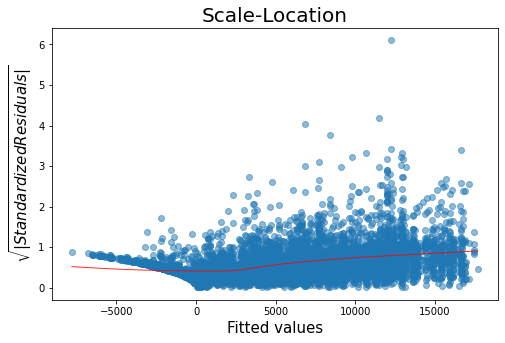

In [47]:
plot1 = plt.figure(figsize=(8, 5))

plt.scatter(model_fitted_y, model_norm_residuals_abs_sqrt, alpha=0.5);
sns.regplot(model_fitted_y, model_norm_residuals_abs_sqrt,
            scatter=False,
            ci=False,
            lowess=True,
            line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8});
plot1.axes[0].set_title('Scale-Location',fontdict={'fontsize':20})
plot1.axes[0].set_xlabel('Fitted values', fontdict={'fontsize':15})
plot1.axes[0].set_ylabel('$\sqrt{|Standardized Residuals|}$', fontdict={'fontsize':15});

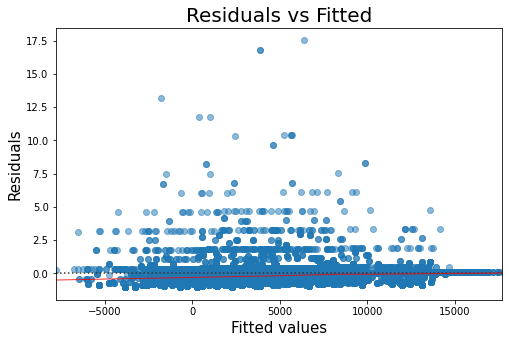

In [48]:
plot1 = plt.figure(figsize=(8, 5))
plot1.axes[0] = sns.residplot(model_fitted_y, listing_dame.columns[-1], data=listing_dame,
                          lowess=True,
                          scatter_kws={'alpha': 0.5},
                          line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8})

plot1.axes[0].set_title('Residuals vs Fitted', fontdict={'fontsize':20})
plot1.axes[0].set_xlabel('Fitted values', fontdict={'fontsize':15})
plot1.axes[0].set_ylabel('Residuals', fontdict={'fontsize':15});

<Figure size 576x360 with 0 Axes>

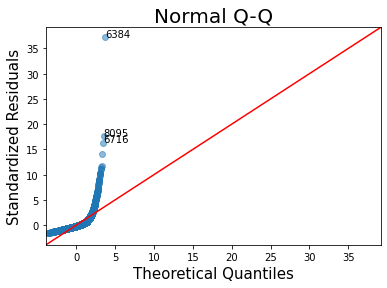

In [49]:
plot1 = plt.figure(figsize=(8, 5))

QQ = ProbPlot(model_norm_residuals)
plot1 = QQ.qqplot(line='45', alpha=0.5, color='#4C72B0', lw=1)

# annotations
abs_norm_resid = np.flip(np.argsort(np.abs(model_norm_residuals)), 0)
abs_norm_resid_top_3 = abs_norm_resid[:3]
for r, i in enumerate(abs_norm_resid_top_3):
    plot1.axes[0].annotate(i,xy=(np.flip(QQ.theoretical_quantiles, 0)[r],
                                   model_norm_residuals[i]));
plot1.axes[0].set_title('Normal Q-Q', fontdict={'fontsize':20})
plot1.axes[0].set_xlabel('Theoretical Quantiles', fontdict={'fontsize':15})
plot1.axes[0].set_ylabel('Standardized Residuals', fontdict={'fontsize':15});
plot1.show()

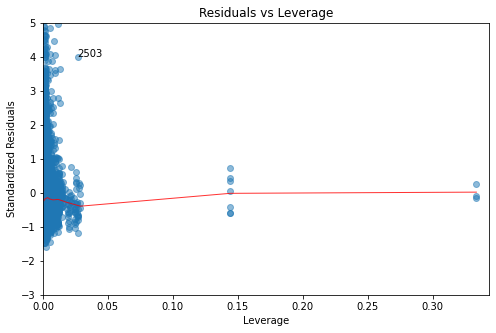

In [50]:
plot1 = plt.figure(figsize=(8, 5))
plt.scatter(model_leverage, model_norm_residuals, alpha=0.5);
sns.regplot(model_leverage, model_norm_residuals,
            scatter=False,
            ci=False,
            lowess=True,
            line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8});

plot1.axes[0].set_title('Residuals vs Leverage')
plot1.axes[0].set_xlabel('Leverage')
plot1.axes[0].set_ylabel('Standardized Residuals');

# annotations
leverage_top_3 = np.flip(np.argsort(model_cooks), 0)[:3]
for i in leverage_top_3:
    plot1.axes[0].annotate(i,xy=(model_leverage[i],
                                    model_norm_residuals[i]));
plot1.axes[0].set_xlim(0, max(model_leverage)+0.01)
plot1.axes[0].set_ylim(-3, 5)
plot1.show()

### 2. Model at Iteration 3 (Log)

In [51]:
# Run DAME
dame_model3 = dame_flame.matching.DAME(
    repeats=False, verbose=3, want_pe=True, early_stop_iterations=3
)
dame_model3.fit(
    listings5,
    treatment_column_name="host_is_superhost",
    outcome_column_name="annual_listing_revenue",
)
result3 = dame_model3.predict(listings5)

Iteration number:  1
	Number of matched groups formed in total:  1617
	Unmatched treated units:  5961 out of a total of  10179 treated units
	Unmatched control units:  9586 out of a total of  15591 control units
	Predictive error of covariates chosen this iteration:  0
	Number of matches made in this iteration:  10223
	Number of matches made so far:  10223
	In this iteration, the covariates dropped are:  set()
Iteration number:  2
	Number of matched groups formed in total:  1617
	Unmatched treated units:  5961 out of a total of  10179 treated units
	Unmatched control units:  9586 out of a total of  15591 control units
	Predictive error of covariates chosen this iteration:  152744879.79523763
	Number of matches made in this iteration:  0
	Number of matches made so far:  10223
	In this iteration, the covariates dropped are:  frozenset({'bathrooms_text'})
Iteration number:  3
	Number of matched groups formed in total:  1617
	Unmatched treated units:  5961 out of a total of  10179 treated 

In [52]:
# Add weights and annual revenue
listing_dame3 = get_dataframe(dame_model3, result)
listing_dame3.head(5)

,host_response_time,host_acceptance_rate,host_is_superhost,host_identity_verified,room_type,accommodates,bathrooms_text,bedrooms,beds,minimum_nights,...,review_scores_value,instant_bookable,calculated_host_listings_count,county,essentials,other_amenities,annual_listing_revenue,match_group,match_group_size,weights
8,1,0,0,1,0,1,1,1,1,0,...,0,0,0,1,1,1,10597.014925,437.0,7.0,0.569464
17,0,0,0,1,0,0,0,0,0,0,...,0,0,3,1,1,1,2367.164179,1318.0,17.0,0.438049
18,0,1,0,1,0,1,0,0,0,0,...,0,1,3,1,1,1,2561.194030,1361.0,38.0,0.321472
22,0,1,1,1,0,0,0,0,0,0,...,0,1,0,1,1,1,5695.522388,326.0,14.0,1.000000
26,0,1,0,1,0,1,1,1,1,0,...,0,1,3,1,1,1,744.776119,1368.0,82.0,0.345130


In [53]:
listing_dame3['log_revenue'] = np.log2(listing_dame3['annual_listing_revenue'])

In [54]:
# Run regression
model3 = smf.ols(
    "log_revenue ~ host_is_superhost + C(county) + C(host_response_time) + C(host_acceptance_rate) + host_identity_verified +\
        C(room_type) + C(accommodates) + C(bathrooms_text) + C(bedrooms) + C(beds) + C(minimum_nights) + C(maximum_nights) + \
            C(review_scores_rating) + C(review_scores_accuracy) + C(review_scores_cleanliness) + C(review_scores_checkin) + C(review_scores_communication) + \
                C(review_scores_location) + C(review_scores_value) + instant_bookable + C(calculated_host_listings_count) + essentials + C(other_amenities)",
    listing_dame3,
    weights=listing_dame3["weights"],
).fit()

print(model3.summary())


                            OLS Regression Results                            
Dep. Variable:            log_revenue   R-squared:                       0.432
Model:                            OLS   Adj. R-squared:                  0.430
Method:                 Least Squares   F-statistic:                     286.7
Date:                Mon, 01 Aug 2022   Prob (F-statistic):               0.00
Time:                        13:07:48   Log-Likelihood:                -20355.
No. Observations:               10223   AIC:                         4.077e+04
Df Residuals:                   10195   BIC:                         4.097e+04
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

/Users/tegochang/opt/miniconda3/lib/python3.9/site-packages/statsmodels/regression/linear_model.py:891: ValueWarning: Weights are not supported in OLS and will be ignoredAn exception will be raised in the next version.
/Users/tegochang/opt/miniconda3/lib/python3.9/site-packages/statsmodels/base/model.py:127: ValueWarning: unknown kwargs ['weights']


# MODEL EVALUATION (with log) - Our Final Regression Model

In [55]:
model_fitted_y = model3.fittedvalues
model_residuals = model3.resid
model_norm_residuals = model3.get_influence().resid_studentized_internal
model_norm_residuals_abs_sqrt = np.sqrt(np.abs(model_norm_residuals))
model_abs_resid = np.abs(model_residuals)
model_leverage = model3.get_influence().hat_matrix_diag
model_cooks = model3.get_influence().cooks_distance[0]

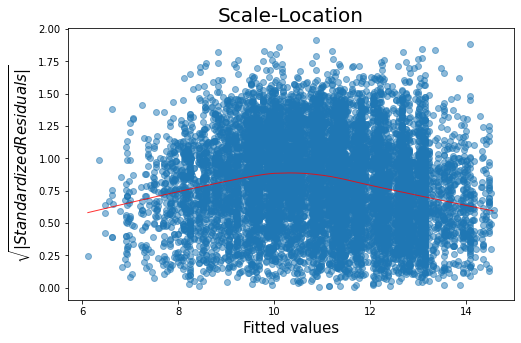

In [56]:
plot1 = plt.figure(figsize=(8, 5))

plt.scatter(model_fitted_y, model_norm_residuals_abs_sqrt, alpha=0.5);
sns.regplot(model_fitted_y, model_norm_residuals_abs_sqrt,
            scatter=False,
            ci=False,
            lowess=True,
            line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8});
plot1.axes[0].set_title('Scale-Location',fontdict={'fontsize':20})
plot1.axes[0].set_xlabel('Fitted values', fontdict={'fontsize':15})
plot1.axes[0].set_ylabel('$\sqrt{|Standardized Residuals|}$', fontdict={'fontsize':15});

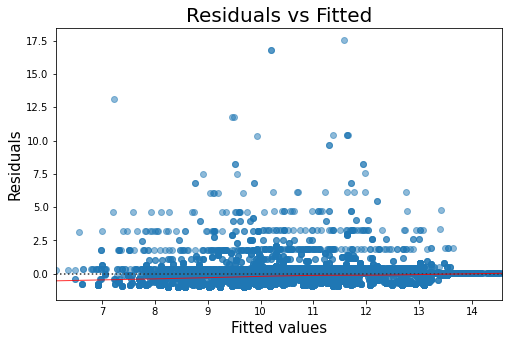

In [57]:
plot1 = plt.figure(figsize=(8, 5))
plot1.axes[0] = sns.residplot(model_fitted_y, listing_dame.columns[-1], data=listing_dame,
                          lowess=True,
                          scatter_kws={'alpha': 0.5},
                          line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8})

plot1.axes[0].set_title('Residuals vs Fitted', fontdict={'fontsize':20})
plot1.axes[0].set_xlabel('Fitted values', fontdict={'fontsize':15})
plot1.axes[0].set_ylabel('Residuals', fontdict={'fontsize':15});

<Figure size 576x360 with 0 Axes>

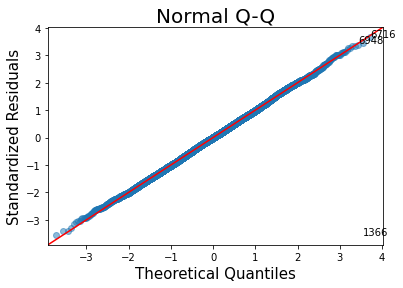

In [58]:
plot1 = plt.figure(figsize=(8, 5))

QQ = ProbPlot(model_norm_residuals)
plot1 = QQ.qqplot(line='45', alpha=0.5, color='#4C72B0', lw=1)

# annotations
abs_norm_resid = np.flip(np.argsort(np.abs(model_norm_residuals)), 0)
abs_norm_resid_top_3 = abs_norm_resid[:3]
for r, i in enumerate(abs_norm_resid_top_3):
    plot1.axes[0].annotate(i,xy=(np.flip(QQ.theoretical_quantiles, 0)[r],
                                   model_norm_residuals[i]));
plot1.axes[0].set_title('Normal Q-Q', fontdict={'fontsize':20})
plot1.axes[0].set_xlabel('Theoretical Quantiles', fontdict={'fontsize':15})
plot1.axes[0].set_ylabel('Standardized Residuals', fontdict={'fontsize':15});
plot1.show()

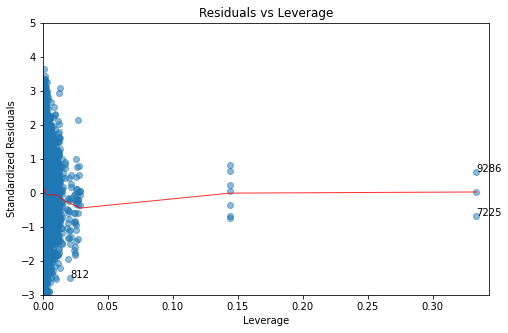

In [59]:
plot1 = plt.figure(figsize=(8, 5))
plt.scatter(model_leverage, model_norm_residuals, alpha=0.5);
sns.regplot(model_leverage, model_norm_residuals,
            scatter=False,
            ci=False,
            lowess=True,
            line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8});

plot1.axes[0].set_title('Residuals vs Leverage')
plot1.axes[0].set_xlabel('Leverage')
plot1.axes[0].set_ylabel('Standardized Residuals');

# annotations
leverage_top_3 = np.flip(np.argsort(model_cooks), 0)[:3]
for i in leverage_top_3:
    plot1.axes[0].annotate(i,xy=(model_leverage[i],
                                    model_norm_residuals[i]));
plot1.axes[0].set_xlim(0, max(model_leverage)+0.01)
plot1.axes[0].set_ylim(-3, 5)
plot1.show()

# CLUSTERING BY HOST

In [60]:
parmas = ['Florida County', 'Response Time of Host[T.1]', 'Response Time of Host[T.2]',
          'Response Time of Host[T.3]', 'Acceptance Rate of Host', 'Room Type[Private]', 'Room Type[Shared]',
          'Accommodates', 'Number of Bathrooms', 'Number of Bedrooms', 'Number of Beds', 'Minimum Nights',
          'Maximum Night', 'Overall Rating', 'Review Score on Accuracy',
          'Review Score on Cleanliness', 'Review Score on Checkin', 'Review Score on Communication', 
          'Review Score on Location', 'Review Score on Value', 'Total listing of Host[T.1]',
          'Total listing of Host[T.2]', 'Total listing of Host[T.3]', 'Other Amenities',
          'Super Host', 'Host Identity verified', 'Instant Booking available', 'Essentials']

In [61]:
# Drop any entries with missing data from the model
fe_groups = listing_dame3.copy()
for i in listing_dame3.columns:
    fe_groups = fe_groups[pd.notnull(fe_groups[i])]

In [62]:
# Adjust SEs
# Again, suppressing actual output for space with semicolon
print(model3.get_robustcov_results(cov_type='cluster',
                            groups=fe_groups.host_is_superhost).summary())

                            OLS Regression Results                            
Dep. Variable:            log_revenue   R-squared:                       0.432
Model:                            OLS   Adj. R-squared:                  0.430
Method:                 Least Squares   F-statistic:                -4.259e+13
Date:                Mon, 01 Aug 2022   Prob (F-statistic):               1.00
Time:                        13:07:54   Log-Likelihood:                -20355.
No. Observations:               10223   AIC:                         4.077e+04
Df Residuals:                   10195   BIC:                         4.097e+04
Df Model:                          27                                         
Covariance Type:              cluster                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

/Users/tegochang/opt/miniconda3/lib/python3.9/site-packages/statsmodels/base/model.py:1863: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 28, but rank is 1


# STATISTICS RESULTS

# ERROR BANDS

In [63]:
m = model3.get_robustcov_results(cov_type='cluster',
                            groups=fe_groups.host_is_superhost)
clus_conf = []
for i in m.conf_int():
  clus_conf.append(i[0])

err_series = m.params - model3.conf_int()[0]


In [64]:
# Calcualte the error bar lengths for confidence intervals.
coef_df = pd.DataFrame({'varname': err_series.index.values[1:],
                        'coef': m.params[1:],
                        'err': err_series[1:],
                       })

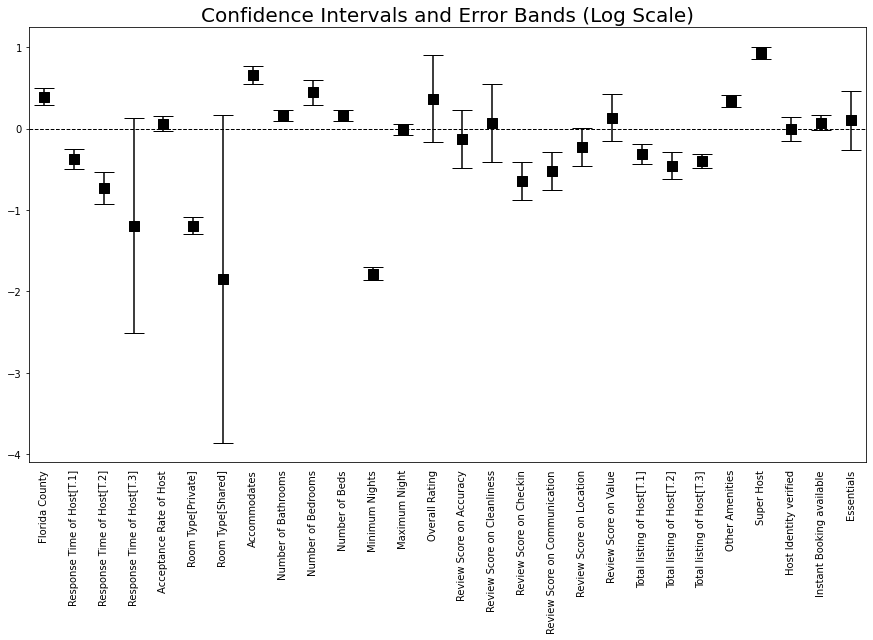

In [65]:
fig, ax = plt.subplots(figsize=(15, 8))
coef_df.plot(x='varname', y='coef', kind='bar', 
             ax=ax, color='none', capsize=10,
             yerr='err', legend=False)

ax.set_title('Confidence Intervals and Error Bands (Log Scale)', fontdict={'fontsize':20})
ax.set_ylabel('')
ax.set_xlabel('')
ax.scatter(x=pd.np.arange(coef_df.shape[0]), 
           marker='s', s=120, 
           y=coef_df['coef'], color='black')
ax.axhline(y=0, linestyle='--', color='black', linewidth=1)
ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(parmas, 
                       rotation=90)

# AVERAGE TREATMENT EFFECT

In [66]:
test = listing_dame3.copy()
test.host_is_superhost = listing_dame3.host_is_superhost.astype('category')

In [67]:
source = test
axis_labels = ("datum.label == 0 ? 'Regular Hosts': 'Super Hosts'")

alt.Chart(source).mark_boxplot(clip=True, size=50, extent="min-max").encode(
    x=alt.X("host_is_superhost:O", title=None, axis=alt.Axis(labels=True, labelExpr=axis_labels, labelAngle=360)), 
    y=alt.Y('log_revenue',title='Log Annual Listing Revenue ($)', scale=alt.Scale()),
    color=alt.Color('host_is_superhost', legend=None, scale=alt.Scale(scheme='dark2')),
).properties(
    width=300,
    height=300,
    title="Revenue generation for Regular and Super Hosts (Log Scale)"

).configure_axis(
    labelFontSize=12,
    titleFontSize=12
)


alt.Chart(...)

In [68]:

alt.Chart(source).mark_boxplot(clip=True, size=50, extent="min-max").encode(
    x=alt.X("host_is_superhost:O", title=None, axis=alt.Axis(labels=True, labelExpr=axis_labels, labelAngle=360)), 
    y=alt.Y('annual_listing_revenue:Q',title='Annual Listing Revenue ($)', scale=alt.Scale(domain=(0, 10000))),
    color=alt.Color('host_is_superhost', legend=None, scale=alt.Scale(scheme='dark2'))
).properties(
    width=300,
    height=300,
    title="Revenue generation for Regular and Super Hosts (Zoomed In View)"
).configure_axis(
    labelFontSize=12,
    titleFontSize=12
)


alt.Chart(...)

# STARGAZER - MODEL SUMMARY

In [69]:
from stargazer.stargazer import Stargazer
from IPython.core.display import HTML
stargazer = Stargazer([model3])
stargazer.rename_covariates({'C(accommodates)[T.1]': 'Accommodates', 'C(bathrooms_text)[T.1]': 'Number of Bathrooms',
                             'C(bedrooms)[T.1]': 'Number of Bedrooms', 'C(beds)[T.1]':'Number of Beds',
                             'C(calculated_host_listings_count)[T.1]': 'Total listing of Host[T.1]',
                             'C(calculated_host_listings_count)[T.2]': 'Total listing of Host[T.2]',
                             'C(calculated_host_listings_count)[T.3]': 'Total listing of Host[T.3]',
                             'C(county)[T.1]': 'Florida','C(host_acceptance_rate)[T.1]': 'Acceptance Rate of Host',
                             'C(host_response_time)[T.1]': 'Response Time of Host[T.1]', 'C(host_response_time)[T.2]':
                             'Response Time of Host[T.2]', 'C(host_response_time)[T.3]': 'Response Time of Host[T.3]',
                             'C(maximum_nights)[T.1]': 'Maximum Night customer stays at listing', 'C(minimum_nights)[T.1]':
                             'Minimum Night customer stays at listing',
                             'C(other_amenities)[T.1]': 'Other Amenities', 'C(review_scores_accuracy)[T.1]': 'Review Score on Accuracy',
                             'C(review_scores_checkin)[T.1]': 'Review Score on Checkin','C(review_scores_cleanliness[T.1]': 'Review Score on Cleanliness',
                             'C(review_scores_communication)[T.1]': 'Review Score on Communication',
                             'C(review_scores_location)[T.1]': 'Review Score on Location',
                             'C(review_scores_rating)[T.1]': 'Overall Rating','essentials': 'Essentials',
                             'C(review_scores_value)[T.1]': 'Review Score on Value',
                             'C(room_type)[T.2]': 'Room Type[Private]', 'C(room_type)[T.3]': 'Room Type[Shared]',
                             'host_identity_verified': 'Host Identity verified',
                             'host_is_superhost': 'Super Host', 'instant_bookable': 'Instant Booking available'
                             })
stargazer.covariate_order(['Intercept','host_is_superhost', 'C(county)[T.1]', 'C(room_type)[T.2]', 'C(room_type)[T.3]','C(accommodates)[T.1]',
                           'C(bathrooms_text)[T.1]', 'C(bedrooms)[T.1]', 'C(beds)[T.1]', 'essentials', 'C(other_amenities)[T.1]', 'instant_bookable',
                           'C(maximum_nights)[T.1]', 'C(minimum_nights)[T.1]', 'C(review_scores_accuracy)[T.1]',
                           'C(review_scores_checkin)[T.1]','C(review_scores_cleanliness)[T.1]','C(review_scores_communication)[T.1]', 
                           'C(review_scores_location)[T.1]', 'C(review_scores_rating)[T.1]', 'C(review_scores_value)[T.1]',
                           'host_identity_verified', 'C(calculated_host_listings_count)[T.1]', 'C(calculated_host_listings_count)[T.2]',
                           'C(calculated_host_listings_count)[T.3]', 'C(host_acceptance_rate)[T.1]', 'C(host_response_time)[T.1]', 
                           'C(host_response_time)[T.2]','C(host_response_time)[T.3]'])

HTML(stargazer.render_html())